In [32]:
# Data Handling
import pandas as pd  # Comprehensive library for data manipulation and analysis.
import numpy as np   # Fundamental package for scientific computing with Python.
import copy          # Shallow and deep copy operations.

# Data Visualization
import matplotlib.pyplot as plt  # Core plotting library for creating static, animated, and interactive visualizations.
import seaborn as sns            # Statistical data visualization library based on matplotlib.
%matplotlib inline  
# Data Profiling
from pandas_profiling import ProfileReport  # Library for generating detailed statistics and report on data.

# Data Preprocessing
from aux import transform_function

# Model Training and Evaluation
from sklearn.model_selection import train_test_split, GridSearchCV  # Utilities for model validation and parameter tuning.
from sklearn.metrics import (classification_report, 
                             make_scorer, recall_score)  # Metrics to evaluate model performance.
from sklearn.impute import SimpleImputer  # Strategies for imputing missing values.
from sklearn.pipeline import Pipeline  # Tool for chaining estimators.
from sklearn.preprocessing import (StandardScaler, 
                                   OneHotEncoder)  # Preprocessing and feature engineering utilities.
from sklearn.compose import ColumnTransformer  # Utility to apply transformers to columns of arrays or pandas DataFrames.
from sklearn.base import BaseEstimator, TransformerMixin  # Base class for all estimators and mixin to create transformers.

# Models

from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier  # Ensemble-based classifiers.
from xgboost import XGBClassifier  # Gradient boosting framework that uses tree based learning algorithms.

# Feature Selection
from sklearn.feature_selection import chi2  # Chi-squared stats to select non-negative features for classification.

# Additional Utilities
import joblib  # Library for saving and loading scikit-learn models.
import shap    # Library providing explanations for the output of machine learning models.
import warnings  # Module to manage warning messages.
from scipy.sparse import csr_matrix  # Scipy's sparse matrix type for efficient operations.

# Warning Configuration
warnings.filterwarnings('ignore', category=FutureWarning)  # Ignore future warnings to maintain clean output logs.


from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.pipeline import Pipeline


from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn.preprocessing import OneHotEncoder, StandardScaler, OrdinalEncoder
import numpy as np
from sklearn.feature_selection import chi2



In [2]:
# versionaing
import pkg_resources

# List of libraries to version
libraries = ["pandas", "numpy", "scikit-learn", "xgboost", "uvicorn", "joblib", "fastapi"]

# Loop through each library and print its installed version
for lib in libraries:
    try:
        version = pkg_resources.get_distribution(lib).version
        print(f"{lib} == {version}")
    except pkg_resources.DistributionNotFound:
        print(f"{lib} not installed.")


pandas == 2.1.4
numpy == 1.24.3
scikit-learn == 1.3.2
xgboost == 2.0.2
uvicorn == 0.23.2
joblib == 1.1.1
fastapi == 0.103.2


In [3]:
# Load data
df_leads = pd.read_csv('leads.csv')
df_offers = pd.read_csv('offers.csv')

In [4]:
# Data profiling
df_leads

,Id,First Name,Use Case,Source,Status,Discarded/Nurturing Reason,Acquisition Campaign,Created Date,Converted,City
0,23okrabh,NaN,Corporate Events,Inbound,Nurturing,Not Fit,NaN,2018-05-26,0,Chicago
1,NaN,Taylor1 Harris1,NaN,Inbound,Discarded,Not feeling,Event Management Guide,2018-10-17,0,Denver
2,hbzt0kp1,Alex6 Jackson3,NaN,Inbound,Nurturing,Competitor,NaN,2019-03-29,0,Denver
3,velluwdq,Bailey2 Taylor6,Corporate Events,Inbound,Discarded,Not Target,NaN,2018-05-26,0,NaN
4,NaN,Drew5 Wilson5,Corporate Events,Inbound,Nurturing,Competitor,NaN,2018-10-17,0,NaN
...,...,...,...,...,...,...,...,...,...,...
61634,lpb8obv3,NaN,Corporate Events,Outbound,New,NaN,Digital kit,2020-10-27,0,Phoenix
61635,mzcq31rg,NaN,NaN,Outbound,New,NaN,ArtFair,2020-10-27,0,NaN
61636,2ajg0z5w,NaN,Corporate Events,Outbound,New,NaN,NaN,2020-10-27,0,NaN
61637,k6wq2pi9,NaN,NaN,Outbound,New,NaN,VirtualMeetups,2020-10-27,0,Charlotte


In [5]:
# Data profiling
profile = ProfileReport(df_leads)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
# Data profiling
profile = ProfileReport(df_offers)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
# Data profiling
df_leads.columns

Index(['Id', 'First Name', 'Use Case', 'Source', 'Status',
       'Discarded/Nurturing Reason', 'Acquisition Campaign', 'Created Date',
       'Converted', 'City'],
      dtype='object')

In [8]:
# Data profiling
df_offers.columns

Index(['Id', 'Use Case', 'Status', 'Created Date', 'Close Date', 'Price',
       'Discount code', 'Pain', 'Loss Reason'],
      dtype='object')

In [9]:
# Exploratory Data Analysis: Aggregating 'df_offers' data
# 'grouped_leads' shows the count of offers per unique 'Id' in 'df_offers'.

grouped_leads = df_offers.groupby(['Id']).size().reset_index(name='Count')
grouped_leads

,Id,Count
0,004plaq7,1
1,006hvqrh,1
2,00dsslbf,1
3,00ik2lit,1
4,00m6eiel,1
...,...,...
4919,zzaotiek,1
4920,zzbvnkgd,1
4921,zzc9sbzh,1
4922,zzua9jrh,1


In [10]:
# Count of offers per unique 'Id' in 'df_offers'
grouped_leads = df_leads.groupby(['Id']).size().reset_index(name='Count')
grouped_leads

,Id,Count
0,001g2nhy,1
1,002d5oh9,1
2,002umohd,1
3,004plaq7,1
4,005ue764,1
...,...,...
43967,zzupfov0,1
43968,zzwb7m8d,1
43969,zzxcb4p0,1
43970,zzxhcs0b,1


In [11]:
# Exploratory Data Analysis: Aggregating 'df_offers' data
filtered_leads = df_leads[df_leads['Id'].notnull()]
df = pd.merge(filtered_leads, df_offers, how= 'left' ,on='Id')
df

,Id,First Name,Use Case_x,Source,Status_x,Discarded/Nurturing Reason,Acquisition Campaign,Created Date_x,Converted,City,Use Case_y,Status_y,Created Date_y,Close Date,Price,Discount code,Pain,Loss Reason
0,23okrabh,NaN,Corporate Events,Inbound,Nurturing,Not Fit,NaN,2018-05-26,0,Chicago,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,hbzt0kp1,Alex6 Jackson3,NaN,Inbound,Nurturing,Competitor,NaN,2019-03-29,0,Denver,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,velluwdq,Bailey2 Taylor6,Corporate Events,Inbound,Discarded,Not Target,NaN,2018-05-26,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,vwm9vcdc,Harper11 Johnson11,NaN,Inbound,Nurturing,Not the right moment,NaN,2019-03-29,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,kbfjr4vz,Drew6 Taylor17,NaN,Inbound,Nurturing,Not feeling,NaN,2019-03-29,0,Denver,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43994,lpb8obv3,NaN,Corporate Events,Outbound,New,NaN,Digital kit,2020-10-27,0,Phoenix,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
43995,mzcq31rg,NaN,NaN,Outbound,New,NaN,ArtFair,2020-10-27,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
43996,2ajg0z5w,NaN,Corporate Events,Outbound,New,NaN,NaN,2020-10-27,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
43997,k6wq2pi9,NaN,NaN,Outbound,New,NaN,VirtualMeetups,2020-10-27,0,Charlotte,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [12]:
profile = ProfileReport(df)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [13]:

#The code is used for data analysis in a DataFrame df:
#It calculates the number of leads in the dataset.
#It calculates the number of leads that were converted.

df.groupby(['Loss Reason']).size().reset_index(name='Count').sort_values(by='Count', ascending=False)
df.groupby(['Status_x', 'Converted', 'Status_y', 'Loss Reason']).size().reset_index(name='Count').sort_values(by='Count', ascending=False)


,Status_x,Converted,Status_y,Loss Reason,Count
4,Qualified,1,Closed Lost,no response,513
0,Qualified,1,Closed Lost,lost to competitor,382
7,Qualified,1,Closed Lost,price,192
5,Qualified,1,Closed Lost,not target,188
3,Qualified,1,Closed Lost,no product fit,151
1,Qualified,1,Closed Lost,no budget,105
6,Qualified,1,Closed Lost,other,9
8,Qualified,1,Closed Won,not target,2
2,Qualified,1,Closed Lost,no decision,1


In [14]:

# Grouping the data and counting occurrences, including NaN values
grouped_data = df.groupby(['Converted','Status_x', 'Status_y', 'Loss Reason'], dropna=False).size().reset_index(name='count').sort_values(by=['Converted','Status_x',  'Status_y', 'Loss Reason'], ascending=False)
grouped_data

,Converted,Status_x,Status_y,Loss Reason,count
28,1,Qualified,Negotiation,NaN,98
27,1,Qualified,Demo 2,NaN,12
26,1,Qualified,Demo 1,NaN,126
24,1,Qualified,Closed Won,not target,2
25,1,Qualified,Closed Won,NaN,1923
23,1,Qualified,Closed Lost,price,192
22,1,Qualified,Closed Lost,other,9
21,1,Qualified,Closed Lost,not target,188
20,1,Qualified,Closed Lost,no response,513
19,1,Qualified,Closed Lost,no product fit,151


In [15]:
# Createa a new column 'real_converted' in df, marking rows as 'Closed Won' with 1. Then filters df for specific statuses, and counts occurrences of 'real_converted' values.
df['real_converted'] = 0

# Update 'real_converted' to 1 where 'Status_y' is 'Closed Won'
df.loc[df['Status_y'] == 'Closed Won', 'real_converted'] = 1

# Filter the data based on the updated 'real_converted' column, 'Status_y', and 'Status_x'
data = df[(df['real_converted'] == 1) | (df['Status_y'] == 'Closed Lost') | (df['Status_x'] == 'Discarded')]

data.value_counts('real_converted').reset_index(name='count')


,real_converted,count
0,0,17125
1,1,1941


In [16]:
data.columns

Index(['Id', 'First Name', 'Use Case_x', 'Source', 'Status_x',
       'Discarded/Nurturing Reason', 'Acquisition Campaign', 'Created Date_x',
       'Converted', 'City', 'Use Case_y', 'Status_y', 'Created Date_y',
       'Close Date', 'Price', 'Discount code', 'Pain', 'Loss Reason',
       'real_converted'],
      dtype='object')

In [17]:
profile = ProfileReport(data)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [18]:
train, test = train_test_split(data, test_size=0.3, random_state=33, stratify=data['real_converted'])
train.head()

,Id,First Name,Use Case_x,Source,Status_x,Discarded/Nurturing Reason,Acquisition Campaign,Created Date_x,Converted,City,Use Case_y,Status_y,Created Date_y,Close Date,Price,Discount code,Pain,Loss Reason,real_converted
25604,eyhj4xbj,Alex17 White3,Corporate Events,Outbound,Discarded,Unreachable,NaN,2019-06-18,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
14883,eh666gdx,Skyler12 Williams17,Educational Seminars,Inbound,Qualified,NaN,Follow-up: digital guide,2019-04-20,1,Jacksonville,Educational Seminars,Closed Won,2019-08-02,2019-12-02,1008.0,RENEWYEAR30,operations,NaN,1
8847,bh98zjfg,NaN,Corporate Events,Inbound,Discarded,Not Target,NaN,2018-12-25,0,Washington,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
8588,mc7c48t7,NaN,NaN,Inbound,Discarded,Not Target,NaN,2018-12-23,0,San Francisco,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
19241,vzuwczpp,Jamie18 Martinez9,Corporate Events,Inbound,Qualified,NaN,NaN,2018-09-23,1,Charlotte,Corporate Events,Closed Won,2018-05-05,2018-05-05,1344.0,YEARLY30PROMO,operations,NaN,1


In [19]:
# Chi-square Test (chi2) for Feature Selection

# This code performs a chi-square test on selected categorical features in the 'train' DataFrame to evaluate 
# their significance in relation to the 'real_converted' target variable.
# The features tested include: 'Use Case_x', 'Source', 'Acquisition Campaign', 'Created Date_x', and 'City'.
# For each feature:
# - The OneHotEncoder is used to transform categorical values into a format suitable for chi-square testing.
# - The 'chi2' function computes the chi-square statistic and p-value for each category within the feature.
# - The results, including the feature, category value, chi-square statistic, and p-value, are stored in a list.
# The final output is a DataFrame containing these chi-square test results for each category of the selected features,
# allowing for an assessment of their importance in predicting 'real_converted'.



chi2_results = []
for f in ['Use Case_x', 'Source', 'Acquisition Campaign', 'Created Date_x','City']:
    onehot = OneHotEncoder(sparse_output=False)
    t = onehot.fit_transform(train[[f]])
    values = onehot.categories_[0]
    chi2_stats, p_values = chi2(t, train["real_converted"])

    for value, chi_stat, p_value in zip(values, chi2_stats, p_values):
        chi2_results.append({
            "Feature": f,
            "Value": value,
            "Chi2 stat": chi_stat,
            "p-value": p_value
        })
pd.DataFrame(chi2_results)

,Feature,Value,Chi2 stat,p-value
0,Use Case_x,Concerts and festivals,0.340118,5.597609e-01
1,Use Case_x,Corporate Events,0.422943,5.154723e-01
2,Use Case_x,Educational Seminars,337.988523,1.749598e-75
3,Use Case_x,Sports Events,419.260057,3.535933e-93
4,Use Case_x,Wedding Planning,1.757983,1.848764e-01
...,...,...,...,...
651,City,San Francisco,5.142611,2.334551e-02
652,City,San Jose,3.866162,4.926908e-02
653,City,Seattle,0.679962,4.095999e-01
654,City,Washington,0.289406,5.906011e-01


In [23]:
# Data Transformation and Splitting

# The 'train' DataFrame is transformed using a custom function 'transform_function', which presumably applies 
# specific data preprocessing steps required before model training.
# After transformation, the DataFrame is split into feature set 'X_train' and target variable 'y_train':
# - 'X_train' contains all columns except 'real_converted', serving as the input features for the model.
# - 'y_train' is the 'real_converted' column, representing the target variable for prediction.


train = transform_function(train)
X_train, y_train = train.drop(['real_converted'], axis=1), train['real_converted']

In [24]:

# Preprocessor definition
preprocessor = ColumnTransformer(
    transformers=[
        ("num", StandardScaler(), make_column_selector(dtype_include=np.number)),
        ("cat", OneHotEncoder(handle_unknown='ignore'), make_column_selector(dtype_include=object))
    ]
)

# Pipeline definition
pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', None)  # Placeholder for the classifier
])

# Parameter grid definition
param_grid = [
    {
        'classifier': [XGBClassifier()],
        'classifier__n_estimators': [300, 400, 500, 600],
        'classifier__max_depth': [5, 8, 10, 12],
        'classifier__learning_rate': [0.01, 0.05, 0.1, 0.2]
    },
    {
        'classifier': [RandomForestClassifier(class_weight='balanced')],
        'classifier__n_estimators': [300, 400, 500, 600],
        'classifier__max_features': ['sqrt', 'log2'],
        'classifier__max_depth': [15, 20, 25, 30],
        'classifier__min_samples_split': [2, 5, 8, 10],
        'classifier__min_samples_leaf': [1, 3, 5, 7]
    },
    {
        'classifier': [GradientBoostingClassifier()],
        'classifier__n_estimators': [300, 400, 500, 600],
        'classifier__max_features': ['sqrt', 'log2'],
        'classifier__max_depth': [15, 20, 25, 30],
        'classifier__min_samples_split': [2, 5, 8, 10],
        'classifier__min_samples_leaf': [1, 3, 5, 7]
  
    }
]



In [25]:
# function of score for the recall of the class 1

def recall_class1(y_true, y_pred):
    return recall_score(y_true, y_pred, pos_label=1)

custom_recall_scorer = make_scorer(recall_score, pos_label=1)


random_search = RandomizedSearchCV(
    pipeline, 
    param_distributions=param_grid,  # use param_distributions instead of param_grid
    n_iter=100,  # Number of parameter settings that are sampled. n_iter trades off runtime vs quality of the solution.
    cv=5, 
    n_jobs=-1, 
    scoring=custom_recall_scorer, 
    verbose=3,
    random_state=42  # Optional, but specifying a random_state can be useful for reproducibility
)

# Fit GridSearchCV
random_search.fit(X_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV 3/5] END classifier=XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...), classifier__learning_rate=0.2, classifier__max_depth=10, classifier__n_estimators=300;, score=0.120 total time=   0.6s
[CV 2/5] END classifier=XGBClassifi

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(transformers=[('num',
                                                                               StandardScaler(),
                                                                               <sklearn.compose._column_transformer.make_column_selector object at 0x13b1f0810>),
                                                                              ('cat',
                                                                               OneHotEncoder(handle_unknown='ignore'),
                                                                               <sklearn.compose._column_transformer.make_column_selector object at 0x29820b510>)])),
                                             ('classifier', None)])...
                                         'classifier__n_estimators': [300, 400,
                                                                      500,
                                                                      600]},
                                        {'classifier': [GradientBoostingClassifier()],
                                         'classifier__max_depth': [15, 20, 25,
                                                                   30],
                                         'classifier__max_features': ['sqrt',
                                                                      'log2'],
                                         'classifier__min_samples_leaf': [1, 3,
                                                                          5,
                                                                          7],
                                         'classifier__min_samples_split': [2, 5,
                                                                           8,
                                                                           10],
                                         'classifier__n_estimators': [300, 400,
                                                                      500,
                                                                      600]}],
                   random_state=42,
                   scoring=make_scorer(recall_score, pos_label=1), verbose=3)

In [26]:
# Display the best parameters
print(random_search.best_params_)

# Display a dataframe with the results ordered by rank
pd.DataFrame(random_search.cv_results_).sort_values(by='rank_test_score').head(10)


{'classifier__n_estimators': 500, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 7, 'classifier__max_features': 'log2', 'classifier__max_depth': 15, 'classifier': RandomForestClassifier(class_weight='balanced')}


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_classifier__n_estimators,param_classifier__min_samples_split,param_classifier__min_samples_leaf,param_classifier__max_features,param_classifier__max_depth,param_classifier,param_classifier__learning_rate,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
70,2.264072,0.055270,0.130737,0.013562,500,2,7,log2,15,RandomForestClassifier(class_weight='balanced'),NaN,"{'classifier__n_estimators': 500, 'classifier_...",0.596429,0.685921,0.678445,0.779116,0.674074,0.682797,0.058037,1
68,2.186174,0.168973,0.097819,0.005461,400,2,7,sqrt,15,RandomForestClassifier(class_weight='balanced'),NaN,"{'classifier__n_estimators': 400, 'classifier_...",0.585714,0.671480,0.703180,0.751004,0.648148,0.671905,0.055187,2
41,2.198018,0.091646,0.104433,0.015166,400,5,5,sqrt,15,RandomForestClassifier(class_weight='balanced'),NaN,"{'classifier__n_estimators': 400, 'classifier_...",0.592857,0.667870,0.689046,0.734940,0.622222,0.661387,0.049894,3
16,1.929359,0.147347,0.083610,0.009163,300,2,5,sqrt,15,RandomForestClassifier(class_weight='balanced'),NaN,"{'classifier__n_estimators': 300, 'classifier_...",0.571429,0.660650,0.685512,0.726908,0.640741,0.657048,0.051576,4
80,3.625450,0.241236,0.210506,0.034907,600,8,5,sqrt,15,RandomForestClassifier(class_weight='balanced'),NaN,"{'classifier__n_estimators': 600, 'classifier_...",0.582143,0.664260,0.667845,0.722892,0.625926,0.652613,0.046872,5
82,2.392602,0.056065,0.119433,0.018159,500,10,3,log2,15,RandomForestClassifier(class_weight='balanced'),NaN,"{'classifier__n_estimators': 500, 'classifier_...",0.571429,0.646209,0.657244,0.730924,0.618519,0.644865,0.052246,6
15,3.383573,0.113416,0.170771,0.027724,600,2,7,log2,25,RandomForestClassifier(class_weight='balanced'),NaN,"{'classifier__n_estimators': 600, 'classifier_...",0.571429,0.642599,0.646643,0.714859,0.603704,0.635847,0.048142,7
5,3.344818,0.134388,0.124780,0.020414,500,5,3,sqrt,15,RandomForestClassifier(class_weight='balanced'),NaN,"{'classifier__n_estimators': 500, 'classifier_...",0.567857,0.649819,0.660777,0.714859,0.585185,0.635700,0.053383,8
98,2.999853,0.089257,0.161183,0.037352,600,5,7,log2,25,RandomForestClassifier(class_weight='balanced'),NaN,"{'classifier__n_estimators': 600, 'classifier_...",0.578571,0.646209,0.643110,0.710843,0.596296,0.635006,0.046099,9
26,2.275560,0.192292,0.098255,0.012753,300,8,3,sqrt,15,RandomForestClassifier(class_weight='balanced'),NaN,"{'classifier__n_estimators': 300, 'classifier_...",0.564286,0.649819,0.657244,0.706827,0.596296,0.634895,0.049743,10


In [27]:

# Model Evaluation on Training Data

# The 'y_pred_train_MB' variable stores the predictions made by the best estimator of 'random_search' on the training data 'X_train'.
# 'classification_report' is then used to generate a report comparing these predictions with the actual target values 'y_train'.
# This report, stored in 'report_MB', includes key classification metrics such as precision, recall, and F1-score.
# The report is printed to provide insights into the model's performance on the training dataset.


y_pred_train_MB = random_search.best_estimator_.predict(X_train)
report_MB = classification_report(y_train, y_pred_train_MB)

print("Train Report\n", report_MB)

Train Report
               precision    recall  f1-score   support

           0       0.97      0.68      0.80     11987
           1       0.22      0.80      0.35      1359

    accuracy                           0.70     13346
   macro avg       0.59      0.74      0.57     13346
weighted avg       0.89      0.70      0.76     13346



In [28]:
X_test, y_test = test.drop(['real_converted'], axis=1), test['real_converted']
X_test = transform_function(X_test)

In [29]:
y_pred_test = random_search.best_estimator_.predict( X_test )
report_MB = classification_report( y_test , y_pred_test)

print("Train Report\n", report_MB)

Train Report
               precision    recall  f1-score   support

           0       0.95      0.67      0.79      5138
           1       0.20      0.72      0.31       582

    accuracy                           0.67      5720
   macro avg       0.58      0.69      0.55      5720
weighted avg       0.88      0.67      0.74      5720



In [30]:
#Save the best model
estimator = random_search.best_estimator_
joblib.dump(estimator, "models/leads-v2.0.pkl")

['models/leads-v2.0.pkl']

In [33]:
# Creating copy of model
transformer = copy.deepcopy(estimator)
transformer.steps.pop() # Removing predictor

model_v2 = joblib.load("models/leads-v2.0.pkl")
result = model_v2.predict(X_test)
probability = model_v2.predict_proba(X_test)
print(result)
print(probability)

[0 0 0 ... 1 0 1]
[[0.60027036 0.39972964]
 [0.83266645 0.16733355]
 [0.61514178 0.38485822]
 ...
 [0.41691671 0.58308329]
 [0.5579949  0.4420051 ]
 [0.36037895 0.63962105]]


In [34]:
# Creating copy of model
transformer = copy.deepcopy(model_v2)
transformer.steps.pop() # Removing predictor

('classifier',
 RandomForestClassifier(class_weight='balanced', max_depth=15,
                        max_features='log2', min_samples_leaf=7,
                        n_estimators=500))

In [35]:
from scipy.sparse import csr_matrix

# Assuming transformer.transform(X_test) returns a sparse matrix
sparse_matrix = transformer.transform(X_test)

# Convert the sparse matrix to a dense array
dense_array = sparse_matrix.toarray()

# Create a DataFrame from the first 10 rows of the dense array
X_test_small = pd.DataFrame(dense_array, columns=[f.split("__")[1] for f in transformer['preprocessor'].get_feature_names_out()])

In [36]:
# SHAP Value Calculation for Model Interpretation

# The 'model' function is defined to return predicted probabilities for the positive class (index 1) using the last 
# estimator in 'model_v2' on any given dataset 'X'.
# 'shap.Explainer' is then initialized with this 'model' function and a subset of the test data 'X_test_small' to 
# analyze the model's predictions.
# Using a context manager to suppress UserWarnings, 'shap_values' are computed for 'X_test_small'.
# These SHAP values help in understanding the impact of each feature on the model's prediction.


def model(X):
    return model_v2[-1].predict_proba(X)[:,1]

explainer = shap.Explainer(model, X_test_small)

# Suppressing the warning
with warnings.catch_warnings():
    warnings.filterwarnings("ignore", category=UserWarning)
    shap_values = explainer(X_test_small)


PermutationExplainer explainer: 5721it [27:56,  3.39it/s]                          


In [37]:
# Convert the SHAP values into a DataFrame
shap_values_df = pd.DataFrame(shap_values.values, columns=[f.split("__")[1] for f in transformer['preprocessor'].get_feature_names_out()])

# Get the mean absolute value for each feature
mean_shap_values = shap_values_df.abs().mean().sort_values(ascending=False)
mean_shap_values.to_csv('shap_values.csv')

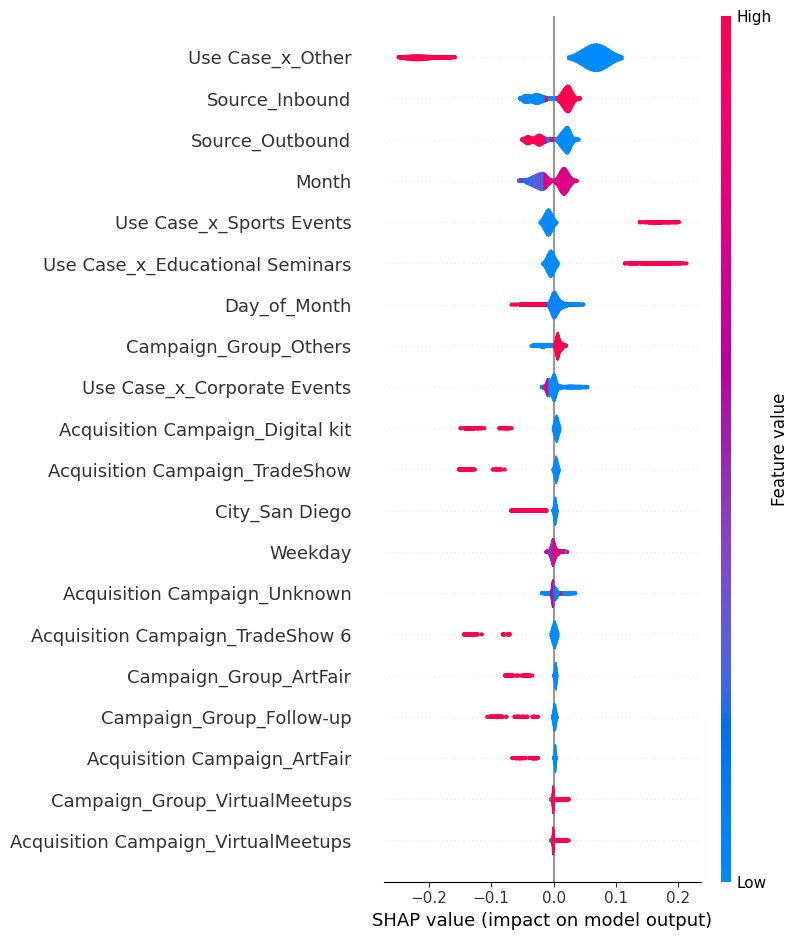

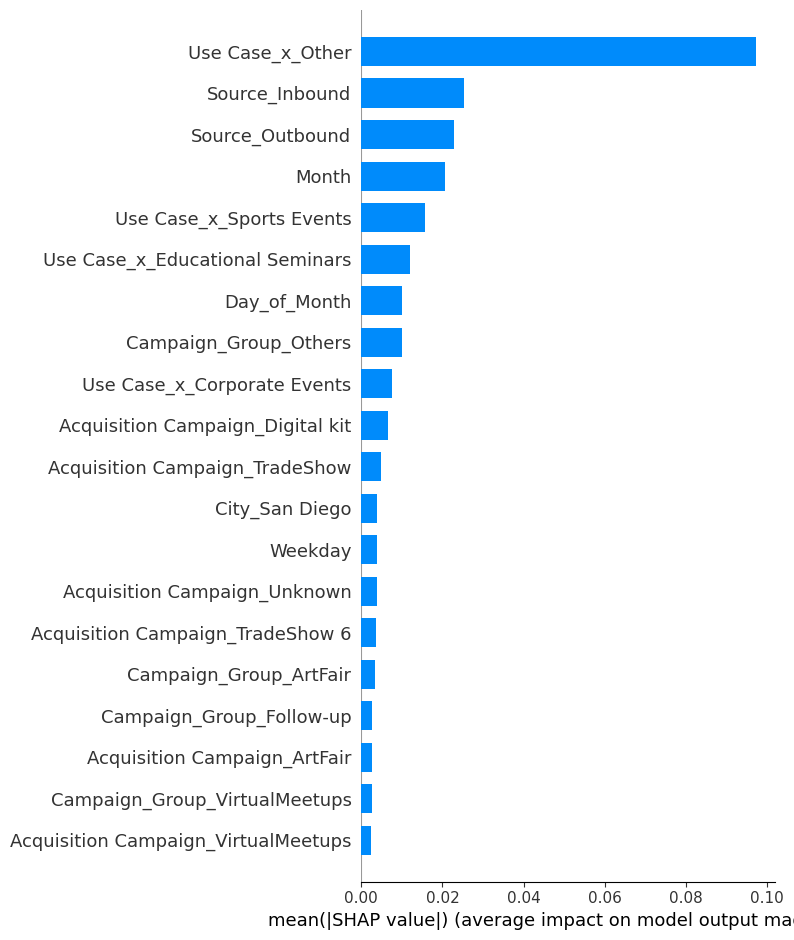

In [38]:
# Generating SHAP Summary Plots for Feature Importance Analysis

# The first line creates a SHAP summary plot with a "violin" plot type using the calculated 'shap_values'.
# This violin plot provides a detailed view of the impact of each feature on model output across the data distribution.

# The second line generates a SHAP summary plot with a "bar" plot type.
# This bar plot succinctly illustrates the average impact of each feature on model output, ranking them by importance.


# get the values of the summary plot
shap.summary_plot(shap_values, plot_type="violin")
# plot the summary plot with the optional plot_type = "bar" and the labels of each bar
shap.summary_plot(shap_values, plot_type="bar")
